# **Lab 5.2 Denoise & Deblur image with Autoencoder**

In [33]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader,Subset
from torch.utils.tensorboard import SummaryWriter
import copy

import numpy as np
import cv2
import os
import random
from skimage.util import random_noise
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
from tqdm import tqdm


## Data Preparation
Complete the class `CustomImageDataset()` that `__getitem__` return ***noisy blury*** image and ***ground truth*** image.
Please ensure that the final image is in RGBscale and has a size of 128x128.
The gaussian blur kernel size parameter should be random in the range [3,11]
and gaussian noise mean should be randoom in range [-50,50].

Parameters:
- image_paths: A list of paths to the images to be loaded.
- gauss_noise: A boolean flag to indicate if Gaussian noise should be added to the image.
- gauss_blur: A boolean flag to indicate if Gaussian blur should be applied to the image.
- resize: The size to which the image should be resized.
- p: Probability of applying certain transformations (like Gaussian noise or blur).

In [34]:
### START CODE HERE ###
class CustomImageDataset(Dataset):
    def __init__(self, image_paths, gauss_noise=False, gauss_blur=False, resize=128, p=0.5):
        self.p = p
        self.resize = resize
        self.gauss_noise = gauss_noise
        self.gauss_blur = gauss_blur
        self.image_paths = image_paths

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        
        # Load image using OpenCV
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB
        
        # Resize image to specified size
        image = cv2.resize(image, (self.resize, self.resize))
        
        # Normalize to [0, 1] range
        image = image.astype(np.float32) / 255.0
        
        # Ground truth is the clean image
        gt_image = image.copy()
        
        # Apply degradations to create noisy/blurry image
        degraded_image = image.copy()
        
        # Apply Gaussian blur with probability p
        if self.gauss_blur and random.random() < self.p:
            # Random kernel size in range [3, 11], must be odd
            kernel_size = random.choice(range(3, 12, 2))  # 3, 5, 7, 9, 11
            degraded_image = cv2.GaussianBlur(degraded_image, (kernel_size, kernel_size), 0)
        
        # Apply Gaussian noise with probability p
        if self.gauss_noise and random.random() < self.p:
            # Random noise mean in range [-50, 50], converted to [0,1] scale
            noise_mean = random.uniform(-50, 50) / 255.0
            noise = np.random.normal(noise_mean, 0.1, degraded_image.shape).astype(np.float32)
            degraded_image = degraded_image + noise
            degraded_image = np.clip(degraded_image, 0, 1)  # Clip to valid range
        
        # Convert to PyTorch tensors and change from HWC to CHW format
        degraded_image = torch.from_numpy(degraded_image.transpose(2, 0, 1))
        gt_image = torch.from_numpy(gt_image.transpose(2, 0, 1))
        
        return degraded_image, gt_image
### END CODE HERE ###

Use your [`CustomImageDataset()`](https://pytorch.org/tutorials/beginner/data_loading_tutorial.html#:~:text=transformed_dataset%20%3D%20FaceLandmarksDataset,3%3A%0A%20%20%20%20%20%20%20%20break)  to load the dataset in the cell below. Then, display the image from the first batch.

<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

- Noisy blury images (this reference use salt and pepper noise)<br>
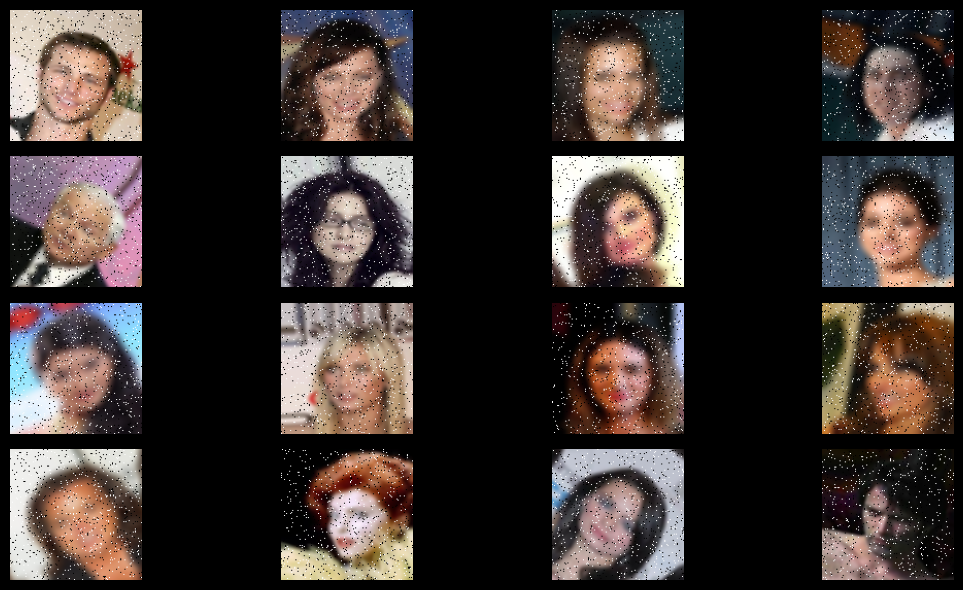

- Ground Truth images<br>
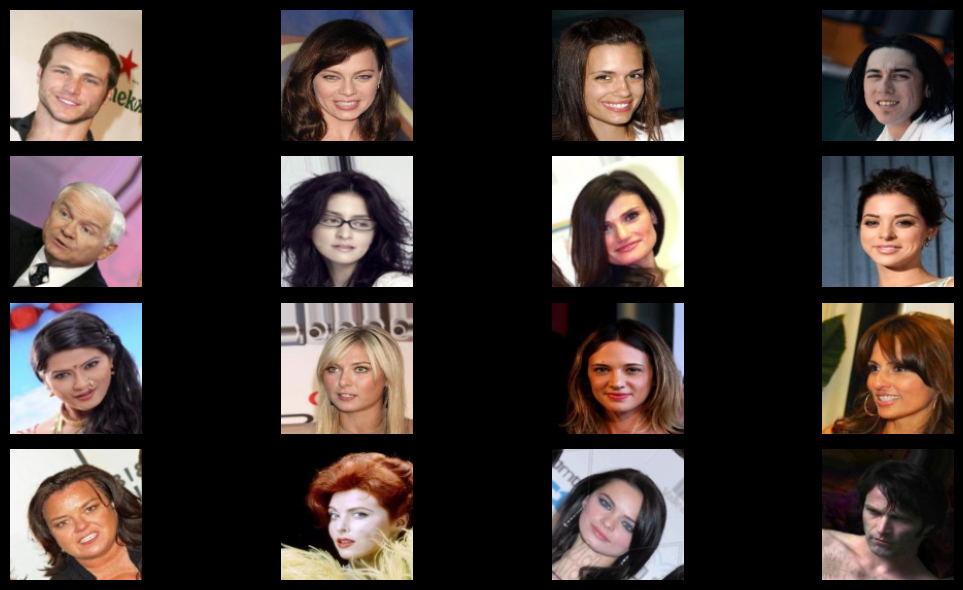

</details>

Complete the function below

Batch shape: torch.Size([9, 3, 128, 128])
Ground truth shape: torch.Size([9, 3, 128, 128])


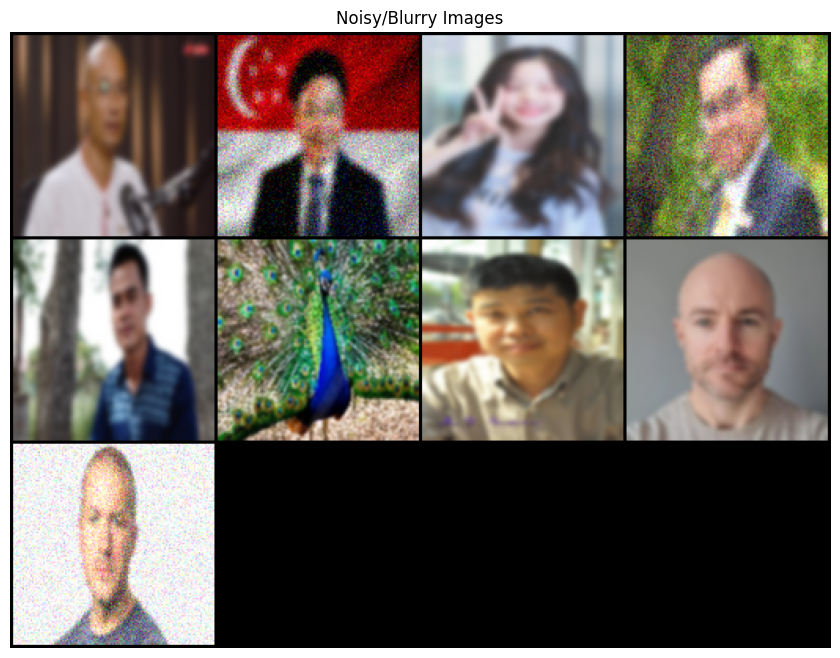

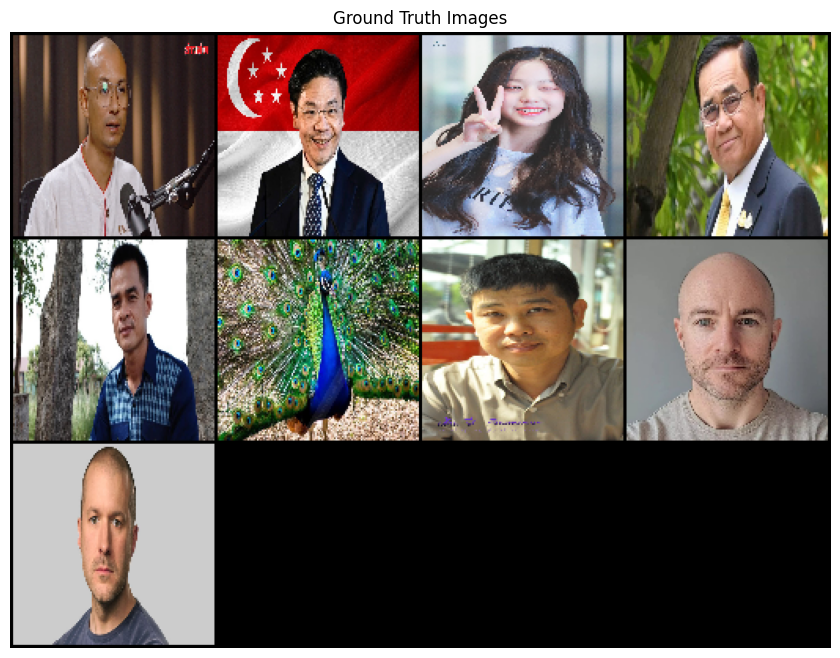

Degraded images - Min: 0.000, Max: 1.000
Ground truth - Min: 0.000, Max: 1.000


In [35]:
### START CODE HERE ###
def imshow_grid(images, title="Image Grid", nrow=4, figsize=(15, 8)):
    """
    Display a grid of images
    
    Args:
        images: Tensor of shape (batch_size, channels, height, width)
        title: Title for the plot
        nrow: Number of images per row
        figsize: Figure size
    """
    # Convert tensor to numpy and handle different formats
    if torch.is_tensor(images):
        images = images.detach().cpu()
    
    # If single image, add batch dimension
    if len(images.shape) == 3:
        images = images.unsqueeze(0)
    
    batch_size = images.shape[0]
    
    # Calculate grid dimensions
    ncol = nrow
    nrows = (batch_size + ncol - 1) // ncol  # Ceiling division
    
    # Create subplot grid
    fig, axes = plt.subplots(nrows, ncol, figsize=figsize)
    fig.suptitle(title, fontsize=16)
    
    # Ensure axes is always a 2D array for consistent indexing
    if nrows == 1 and ncol == 1:
        axes = np.array([[axes]])
    elif nrows == 1:
        axes = axes.reshape(1, -1)
    elif ncol == 1:
        axes = axes.reshape(-1, 1)
    
    # Display images
    for i in range(batch_size):
        row = i // ncol
        col = i % ncol
        
        # Convert from CHW to HWC format and clip values
        img = images[i].permute(1, 2, 0).numpy()
        img = np.clip(img, 0, 1)
        
        # Get the correct axis
        ax = axes[row, col] if nrows > 1 or ncol > 1 else axes[0, 0]
        
        ax.imshow(img)
        ax.axis('off')
        ax.set_title(f'Image {i+1}', fontsize=10)
    
    # Hide empty subplots
    for i in range(batch_size, nrows * ncol):
        row = i // ncol
        col = i % ncol
        ax = axes[row, col] if nrows > 1 or ncol > 1 else axes[0, 0]
        ax.axis('off')
    
    plt.tight_layout()
    plt.show()

# Alternative simpler implementation using torchvision
def imshow_grid_simple(images, title="Images", nrow=4):
    """Simplified version using torchvision utils"""
    import torchvision.utils as vutils
    
    # Make grid
    grid = vutils.make_grid(images, nrow=nrow, padding=2, normalize=True)
    
    # Convert to numpy
    grid_np = grid.permute(1, 2, 0).cpu().numpy()
    
    # Display
    plt.figure(figsize=(15, 8))
    plt.imshow(grid_np)
    plt.title(title)
    plt.axis('off')
    plt.show()

# Use the simple version for now
batch, gt_img = next(iter(dataloader)) 

# Display the noisy/blurry images
print(f"Batch shape: {batch.shape}")
print(f"Ground truth shape: {gt_img.shape}")

# Show noisy/blurry images using the simple version
imshow_grid_simple(batch, title="Noisy/Blurry Images", nrow=4)

# Show ground truth images  
imshow_grid_simple(gt_img, title="Ground Truth Images", nrow=4)

# Print some statistics
print(f"Degraded images - Min: {batch.min():.3f}, Max: {batch.max():.3f}")
print(f"Ground truth - Min: {gt_img.min():.3f}, Max: {gt_img.max():.3f}")
### END CODE HERE ###

In [36]:
### START CODE HERE ###
# Set the data directory path
data_dir = './data'  # or the full path if needed

# Check if data needs to be extracted
if not os.path.exists(data_dir) or len(os.listdir(data_dir)) == 0:
    print("Data directory not found or empty. Please extract the data first.")
    # You may need to extract the data file first
    
# Get list of image files
image_extensions = ['.jpg', '.jpeg', '.png', '.bmp', '.tiff']
image_files = []

if os.path.exists(data_dir):
    for file in os.listdir(data_dir):
        if any(file.lower().endswith(ext) for ext in image_extensions):
            image_files.append(os.path.join(data_dir, file))

print(f"Found {len(image_files)} images in {data_dir}")

# Create dataset with noise and blur
dataset = CustomImageDataset(image_files, 
                            gauss_noise=True, 
                            gauss_blur=True, 
                            resize=128, 
                            p=0.7)

# Create dataloader
dataloader = DataLoader(dataset, batch_size=16, shuffle=True)
### END CODE HERE ###

Found 9 images in ./data


Batch shape: torch.Size([9, 3, 128, 128])
Ground truth shape: torch.Size([9, 3, 128, 128])


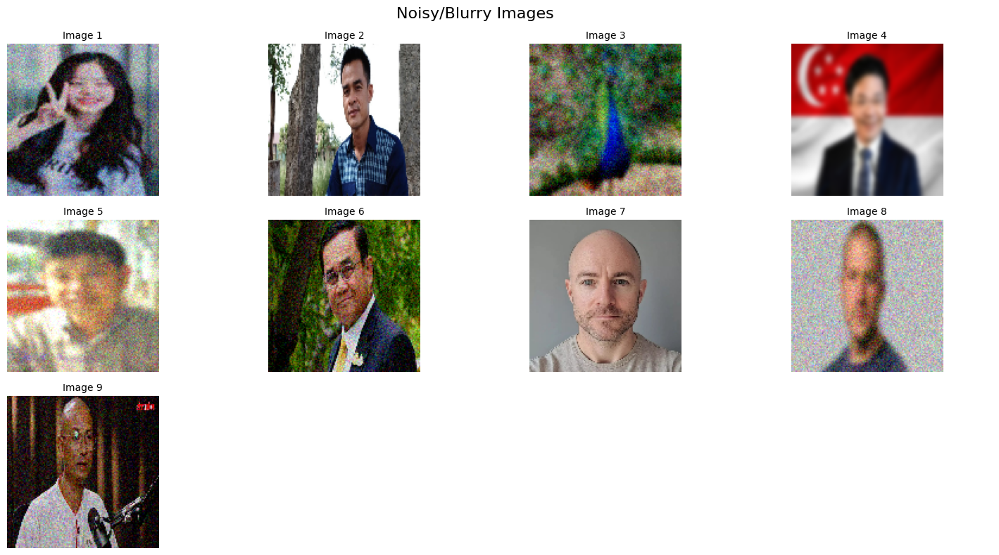

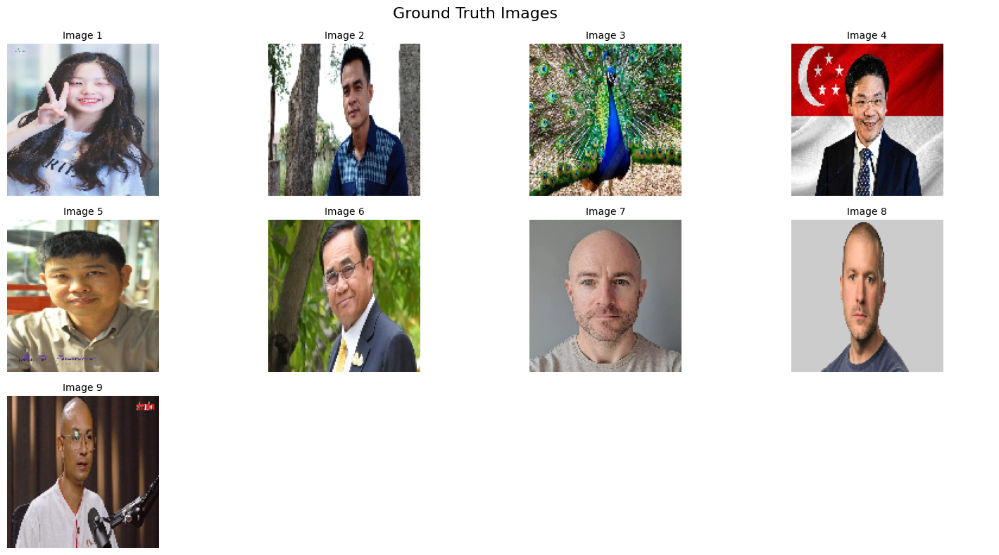

Degraded images - Min: 0.000, Max: 1.000
Ground truth - Min: 0.000, Max: 1.000


In [37]:
### START CODE HERE ###
batch, gt_img = next(iter(dataloader)) 

# Display the noisy/blurry images
print(f"Batch shape: {batch.shape}")
print(f"Ground truth shape: {gt_img.shape}")

# Show noisy/blurry images
imshow_grid(batch, title="Noisy/Blurry Images", nrow=4)

# Show ground truth images  
imshow_grid(gt_img, title="Ground Truth Images", nrow=4)

# Print some statistics
print(f"Degraded images - Min: {batch.min():.3f}, Max: {batch.max():.3f}")
print(f"Ground truth - Min: {gt_img.min():.3f}, Max: {gt_img.max():.3f}")
### END CODE HERE ###

## Create Autoencoder model
You can design your own Autoencoder model based on the provided code below. However, please maintain the concept of 'Autoencoder'.
[Read more.](https://pytorch.org/tutorials/beginner/introyt/modelsyt_tutorial.html)

In [38]:
### START CODE HERE ###
class DownSamplingBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=3, stride=1, padding=1):
        super(DownSamplingBlock, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=kernel_size, stride=stride, padding=padding)
        self.relu = nn.ReLU()
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

    def forward(self, x):
        x = self.conv(x)
        x = self.relu(x)
        x = self.pool(x)
        return x

class UpSamplingBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=3, stride=1, padding=1):
        super(UpSamplingBlock, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=kernel_size, stride=stride, padding=padding)
        self.relu = nn.ReLU()
        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)

    def forward(self, x):
        x = self.conv(x)
        x = self.relu(x)
        x = self.upsample(x)
        return x

class Autoencoder(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv_in = nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1)
        self.down1 = DownSamplingBlock(64, 128, kernel_size=3, stride=1, padding=1)
        ### DESIGN YOUR OWN MODEL ###
        self.up4 = UpSamplingBlock(128, 64, kernel_size=3, stride=1, padding=1)
        self.conv = nn.Conv2d(64, 3, kernel_size=3, stride=1, padding=1)

    def forward(self, x):
        x = self.conv_in(x)
        x = self.down1(x)

        x = self.up4(x)
        x = self.conv(x)
        return x
### END CODE HERE ###

If you define your model class correcly, the cell below should run without any errors.

In [39]:
model = Autoencoder()
print(model)
out = model(batch[0].unsqueeze(dim=0).float())

Autoencoder(
  (conv_in): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (down1): DownSamplingBlock(
    (conv): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (relu): ReLU()
    (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (up4): UpSamplingBlock(
    (conv): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (relu): ReLU()
    (upsample): Upsample(scale_factor=2.0, mode='bilinear')
  )
  (conv): Conv2d(64, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
)


## Train Autoencoder
Complete the `train()` function in the cell below. This function should evaluate the model at every epoch, log the ***training loss, test loss,test PSNR, test SSIM***. Additionally, it should save the model at the last epoch.
<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The log should resemble this, but not be identical

```
🤖Training on cuda
🚀Training Epoch [1/1]: 100%|██████████| 1313/1313 [01:45<00:00, 12.41batch/s, loss=0.0102] 
📄Testing: 100%|██████████| 563/563 [01:10<00:00,  7.95batch/s, loss=0.0106, psnr=16.7, ssim=0.348] 
Summary :
	Train	avg_loss: 0.017262999383663165
	Test	avg_loss: 0.010476540363861867 
                PSNR : 16.839487147468034 
                SSIM : 0.36090552368883694
...
```

</details>

Resource : [PyTorch Training loop](<https://pytorch.org/tutorials/beginner/introyt/trainingyt.html#:~:text=%3D0.9)-,The%20Training%20Loop,-Below%2C%20we%20have>), [PSNR & SSIM](https://ieeexplore.ieee.org/document/5596999)

In [40]:
### START CODE HERE ###
def train(model, opt, loss_fn, train_loader, test_loader, epochs=10, checkpoint_path=None, device='cpu'):
    print("🤖Training on", device)
    model = model.to(device)
    
    for epoch in range(epochs):
        # Training phase
        model.train()
        train_losses = []
        train_bar = tqdm(train_loader, desc=f'🚀Training Epoch [{epoch+1}/{epochs}]', unit='batch')
        
        for images, gt in train_bar:
            # Move data to device
            images = images.to(device)
            gt = gt.to(device)
            
            # Zero gradients
            opt.zero_grad()
            
            # Forward pass
            outputs = model(images)
            loss = loss_fn(outputs, gt)
            
            # Backward pass
            loss.backward()
            opt.step()
            
            # Record loss
            train_losses.append(loss.item())
            
            # Update progress bar
            train_bar.set_postfix(loss=f'{loss.item():.4f}')
        
        # Calculate average training loss
        avg_train_loss = np.mean(train_losses)
        
        # Evaluation phase
        model.eval()
        test_losses = []
        psnr_values = []
        ssim_values = []
        
        test_bar = tqdm(test_loader, desc='📄Testing', unit='batch')
        
        with torch.no_grad():
            for images, gt in test_bar:
                # Move data to device
                images = images.to(device)
                gt = gt.to(device)
                
                # Forward pass
                outputs = model(images)
                loss = loss_fn(outputs, gt)
                test_losses.append(loss.item())
                
                # Calculate PSNR and SSIM for each image in batch
                batch_size = images.shape[0]
                for i in range(batch_size):
                    # Convert tensors to numpy arrays for metric calculation
                    gt_img = gt[i].cpu().numpy().transpose(1, 2, 0)  # CHW to HWC
                    pred_img = outputs[i].cpu().numpy().transpose(1, 2, 0)  # CHW to HWC
                    
                    # Clip values to [0, 1] range
                    gt_img = np.clip(gt_img, 0, 1)
                    pred_img = np.clip(pred_img, 0, 1)
                    
                    # Calculate PSNR
                    psnr_val = psnr(gt_img, pred_img, data_range=1.0)
                    psnr_values.append(psnr_val)
                    
                    # Calculate SSIM (need to specify data_range and multichannel)
                    ssim_val = ssim(gt_img, pred_img, data_range=1.0, multichannel=True, channel_axis=-1)
                    ssim_values.append(ssim_val)
                
                # Update progress bar with current metrics
                current_psnr = np.mean(psnr_values)
                current_ssim = np.mean(ssim_values)
                test_bar.set_postfix(
                    loss=f'{loss.item():.4f}', 
                    psnr=f'{current_psnr:.1f}', 
                    ssim=f'{current_ssim:.3f}'
                )
        
        # Calculate average metrics
        avg_test_loss = np.mean(test_losses)
        avg_psnr = np.mean(psnr_values)
        avg_ssim = np.mean(ssim_values)
        
        # Print summary
        print("Summary :")
        print(f"\tTrain\tavg_loss: {avg_train_loss}")
        print(f"\tTest\tavg_loss: {avg_test_loss}")
        print(f"\t\tPSNR : {avg_psnr}")
        print(f"\t\tSSIM : {avg_ssim}")
        print()
    
    # Save model at the last epoch
    if checkpoint_path:
        torch.save({
            'epoch': epochs,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': opt.state_dict(),
            'train_loss': avg_train_loss,
            'test_loss': avg_test_loss,
            'psnr': avg_psnr,
            'ssim': avg_ssim
        }, checkpoint_path)
        print(f"Model saved to {checkpoint_path}")
    else:
        # Default save location
        torch.save(model.state_dict(), 'autoencoder_model.pth')
        print("Model saved to autoencoder_model.pth")
### END CODE HERE ###

Let's train your model.

In [41]:
### START CODE HERE ###
# Set the data directory path
data_dir = './data'

# Get list of image files
image_extensions = ['.jpg', '.jpeg', '.png', '.bmp', '.tiff']
files = []

if os.path.exists(data_dir):
    for file in os.listdir(data_dir):
        if any(file.lower().endswith(ext) for ext in image_extensions):
            files.append(os.path.join(data_dir, file))

print(f"Found {len(files)} image files")

# Check if we have enough files for train-test split
if len(files) < 2:
    print(f"Error: Need at least 2 image files for train-test split, but found {len(files)}")
    print("Please add more images to the data directory or check if the data was extracted properly.")
    
    # Create a workaround for testing with limited data
    if len(files) == 1:
        print("Using the single image for both training and testing (not recommended for real training)")
        train_files = files
        test_files = files  # Use same file for testing
    else:
        print("No image files found. Please check your data directory.")
        # You might want to exit here or handle this case differently
        train_files = []
        test_files = []
else:
    # Split the dataset into training and testing sets (80-20 split)
    train_files, test_files = train_test_split(files, test_size=0.2, random_state=42)

print(f"Training set: {len(train_files)} images")
print(f"Test set: {len(test_files)} images")

# Only proceed if we have files
if len(train_files) > 0 and len(test_files) > 0:
    # Create training and test datasets
    train_dataset = CustomImageDataset(train_files, 
                                     gauss_noise=True, 
                                     gauss_blur=True, 
                                     resize=128, 
                                     p=0.8)

    test_dataset = CustomImageDataset(test_files, 
                                    gauss_noise=True, 
                                    gauss_blur=True, 
                                    resize=128, 
                                    p=0.8)

    # Create data loaders
    trainloader = DataLoader(train_dataset, 
                            batch_size=min(16, len(train_files)), 
                            shuffle=True, 
                            num_workers=0)

    testloader = DataLoader(test_dataset, 
                           batch_size=min(16, len(test_files)), 
                           shuffle=False, 
                           num_workers=0)

    print(f"Train loader batches: {len(trainloader)}")
    print(f"Test loader batches: {len(testloader)}")
else:
    print("Cannot create datasets due to insufficient data.")
### END CODE HERE ###

Found 9 image files
Training set: 7 images
Test set: 2 images
Train loader batches: 1
Test loader batches: 1


In [42]:
### START CODE HERE ###
# Initialize model, optimizer, and loss function
model = Autoencoder()
opt = optim.Adam(model.parameters(), lr=0.001)
loss_fn = nn.MSELoss()

# Check device availability
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# Train the model
train(model=model, 
      opt=opt, 
      loss_fn=loss_fn, 
      train_loader=trainloader, 
      test_loader=testloader, 
      epochs=10, 
      checkpoint_path='autoencoder_checkpoint.pth',
      device=device)
### END CODE HERE ###

Using device: cpu
🤖Training on cpu


📄Testing: 100%|██████████| 1/1 [00:00<00:00,  8.10batch/s, loss=0.1564, psnr=8.1, ssim=0.223]


Summary :
	Train	avg_loss: 0.3410244584083557
	Test	avg_loss: 0.15637679398059845
		PSNR : 8.058675606123789
		SSIM : 0.22346453368663788



📄Testing: 100%|██████████| 1/1 [00:00<00:00,  7.40batch/s, loss=0.1583, psnr=8.7, ssim=0.299]


Summary :
	Train	avg_loss: 0.10723384469747543
	Test	avg_loss: 0.158284530043602
		PSNR : 8.72757586137209
		SSIM : 0.2989548444747925



📄Testing: 100%|██████████| 1/1 [00:00<00:00,  7.21batch/s, loss=0.0719, psnr=12.0, ssim=0.338]


Summary :
	Train	avg_loss: 0.08199476450681686
	Test	avg_loss: 0.07190611958503723
		PSNR : 11.997344120522968
		SSIM : 0.3379173278808594



📄Testing: 100%|██████████| 1/1 [00:00<00:00,  7.75batch/s, loss=0.0518, psnr=12.9, ssim=0.354]


Summary :
	Train	avg_loss: 0.04928935319185257
	Test	avg_loss: 0.051775529980659485
		PSNR : 12.872256989167337
		SSIM : 0.3541392683982849



📄Testing: 100%|██████████| 1/1 [00:00<00:00,  7.97batch/s, loss=0.0703, psnr=11.5, ssim=0.294]


Summary :
	Train	avg_loss: 0.03744232654571533
	Test	avg_loss: 0.07027368247509003
		PSNR : 11.532144154326016
		SSIM : 0.2936966121196747



📄Testing: 100%|██████████| 1/1 [00:00<00:00,  7.07batch/s, loss=0.0875, psnr=10.6, ssim=0.308]


Summary :
	Train	avg_loss: 0.061403196305036545
	Test	avg_loss: 0.08745113760232925
		PSNR : 10.59573583170031
		SSIM : 0.30792170763015747



📄Testing: 100%|██████████| 1/1 [00:00<00:00,  6.98batch/s, loss=0.0552, psnr=12.6, ssim=0.359]


Summary :
	Train	avg_loss: 0.05580224469304085
	Test	avg_loss: 0.05516919493675232
		PSNR : 12.623152834622587
		SSIM : 0.35851049423217773



📄Testing: 100%|██████████| 1/1 [00:00<00:00,  7.55batch/s, loss=0.0546, psnr=12.6, ssim=0.357]


Summary :
	Train	avg_loss: 0.035454604774713516
	Test	avg_loss: 0.054608073085546494
		PSNR : 12.629049569218463
		SSIM : 0.3570350408554077



📄Testing: 100%|██████████| 1/1 [00:00<00:00,  7.35batch/s, loss=0.0414, psnr=13.9, ssim=0.405]


Summary :
	Train	avg_loss: 0.03321729227900505
	Test	avg_loss: 0.041447486728429794
		PSNR : 13.941718994822207
		SSIM : 0.40457403659820557



📄Testing: 100%|██████████| 1/1 [00:00<00:00,  5.81batch/s, loss=0.0465, psnr=13.5, ssim=0.367]

Summary :
	Train	avg_loss: 0.04580814018845558
	Test	avg_loss: 0.046473562717437744
		PSNR : 13.497041197840002
		SSIM : 0.36719614267349243

Model saved to autoencoder_checkpoint.pth


Let's use your trained model.
<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

- Input images<br>
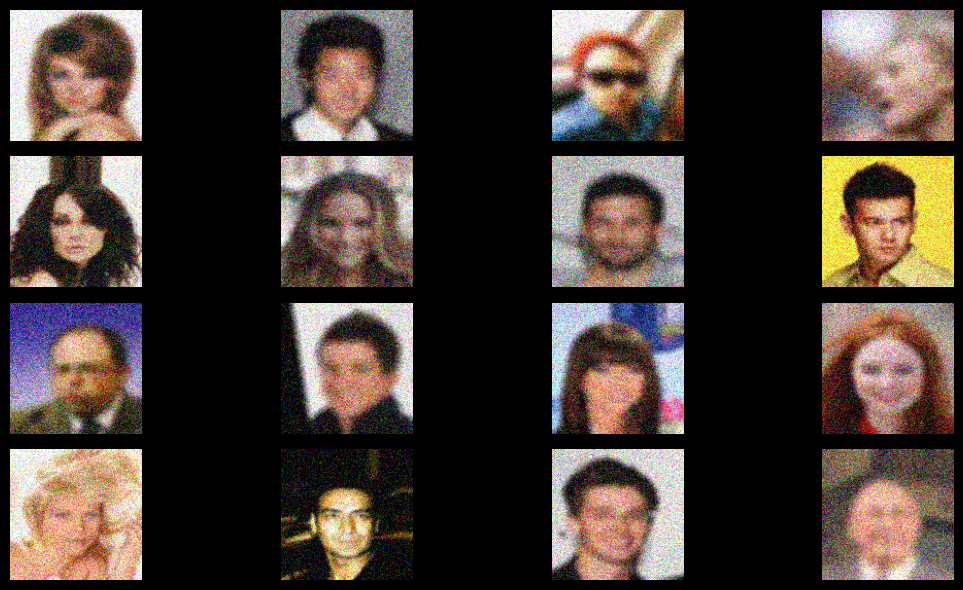

- Output images<br>
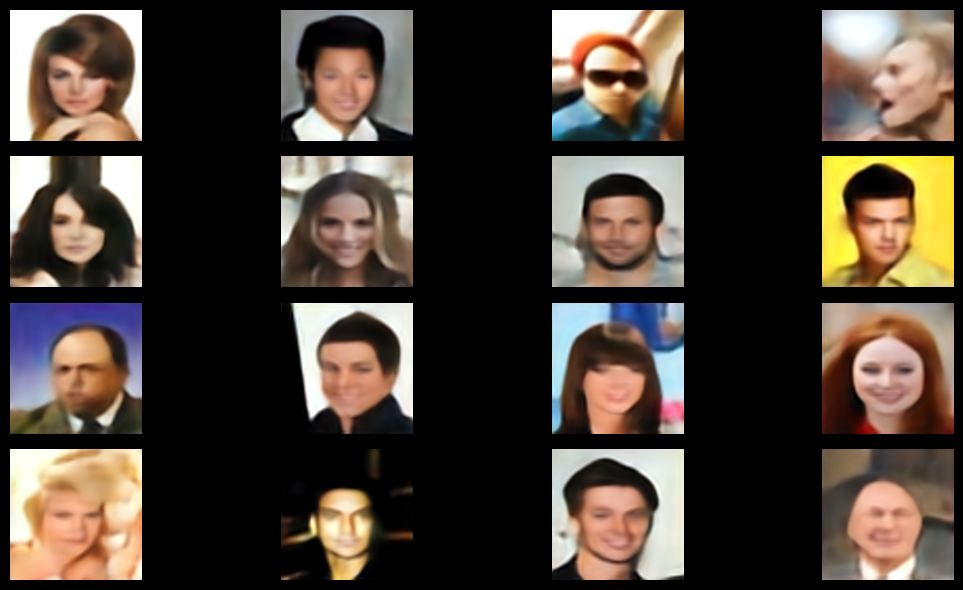

- Ground Truth images<br>
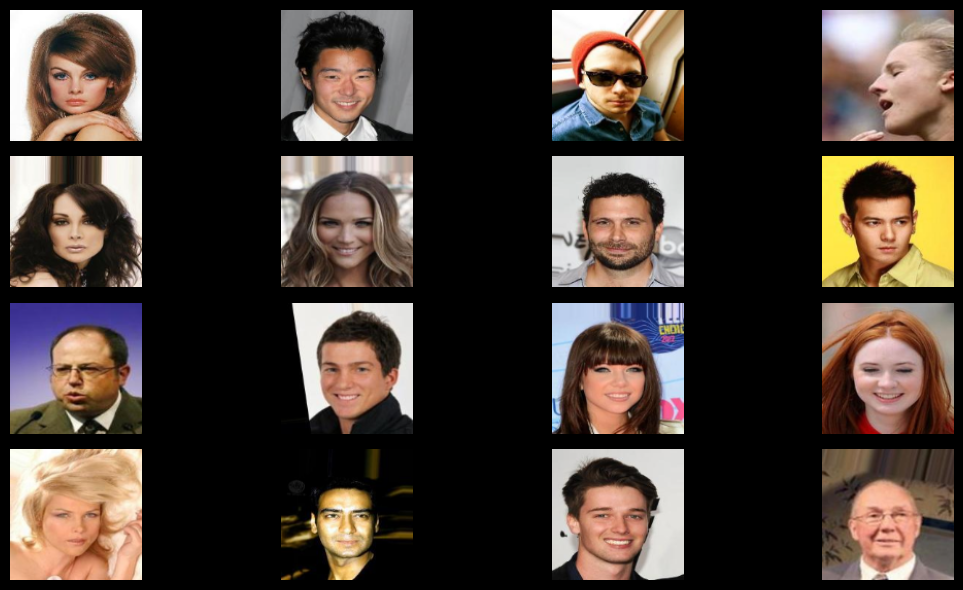

</details>

🔍 Testing the trained autoencoder...
📊 Quality Metrics:
   Average PSNR: 11.22 dB
   Average SSIM: 0.336

🖼️ Visualization Results:
Input Images (Noisy & Blurry):


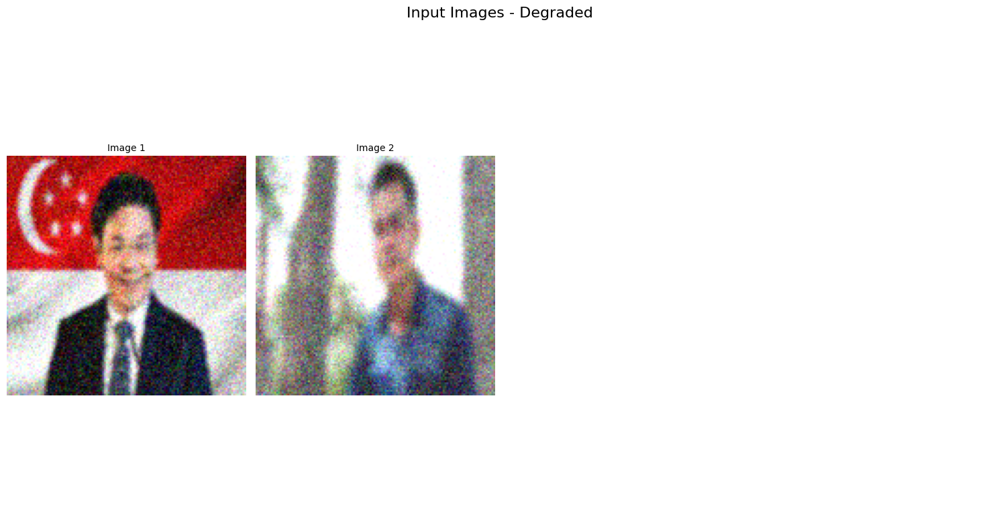

Output Images (Autoencoder Results):


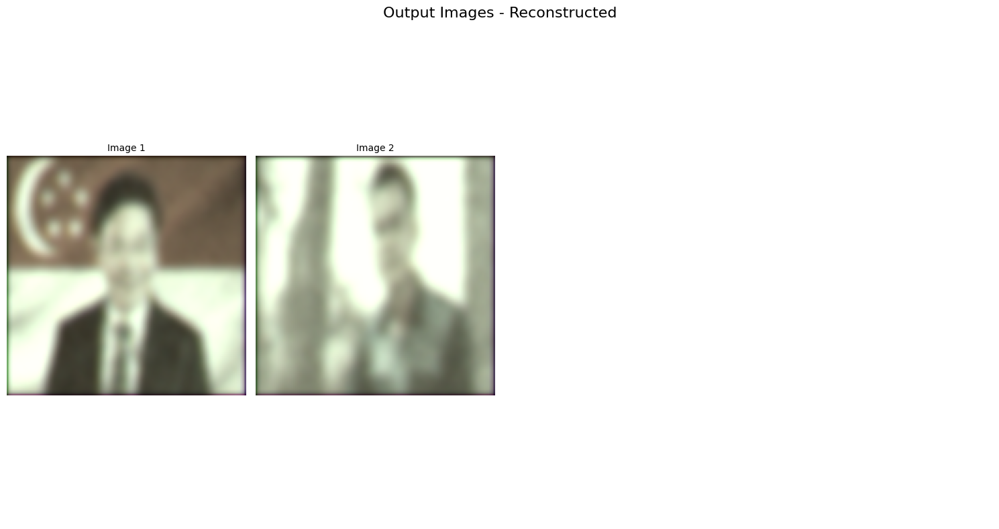

Ground Truth Images (Clean):


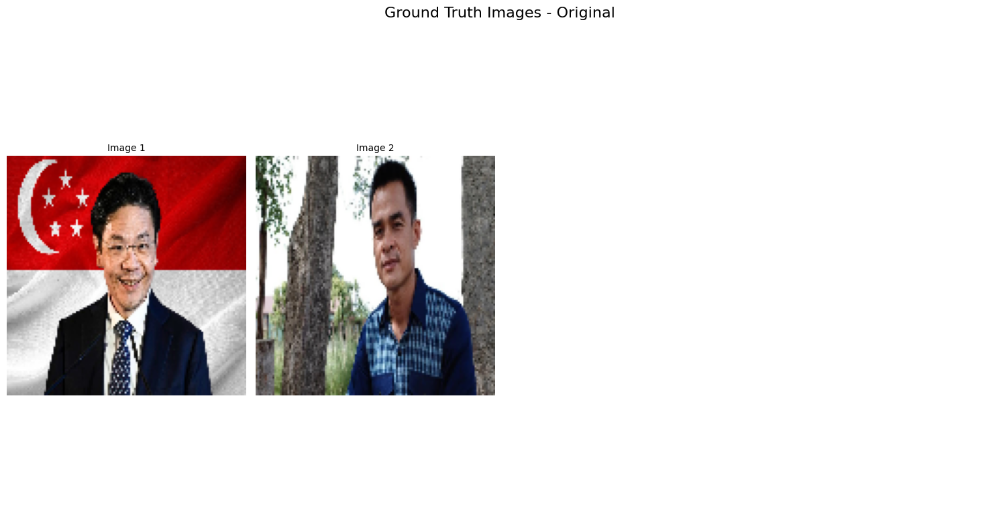

Complete Comparison:


IndexError: index 2 is out of bounds for dimension 0 with size 2

In [43]:
### START CODE HERE ###
# Ensure model is in evaluation mode
model.eval()
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)

print("🔍 Testing the trained autoencoder...")

# Get test samples
test_images, test_gt = next(iter(testloader))
test_images = test_images.to(device)
test_gt = test_gt.to(device)

# Generate predictions
with torch.no_grad():
    reconstructed = model(test_images)

# Move to CPU for visualization
test_images_cpu = test_images.cpu()
reconstructed_cpu = reconstructed.cpu()
test_gt_cpu = test_gt.cpu()

# Calculate quality metrics
total_psnr = 0
total_ssim = 0
num_samples = min(8, test_images.shape[0])

for i in range(num_samples):
    # Convert tensors to numpy (CHW -> HWC)
    gt_np = test_gt_cpu[i].permute(1, 2, 0).numpy()
    recon_np = reconstructed_cpu[i].permute(1, 2, 0).numpy()
    
    # Ensure values are in [0, 1]
    gt_np = np.clip(gt_np, 0, 1)
    recon_np = np.clip(recon_np, 0, 1)
    
    # Calculate PSNR and SSIM
    psnr_val = psnr(gt_np, recon_np, data_range=1.0)
    ssim_val = ssim(gt_np, recon_np, data_range=1.0, multichannel=True, channel_axis=-1)
    
    total_psnr += psnr_val
    total_ssim += ssim_val

avg_psnr = total_psnr / num_samples
avg_ssim = total_ssim / num_samples

print(f"📊 Quality Metrics:")
print(f"   Average PSNR: {avg_psnr:.2f} dB")
print(f"   Average SSIM: {avg_ssim:.3f}")

# Display results
print("\n🖼️ Visualization Results:")

# Input images (degraded)
print("Input Images (Noisy & Blurry):")
imshow_grid(test_images_cpu[:8], title="Input Images - Degraded", nrow=4)

# Output images (reconstructed)
print("Output Images (Autoencoder Results):")
imshow_grid(reconstructed_cpu[:8], title="Output Images - Reconstructed", nrow=4)

# Ground truth images
print("Ground Truth Images (Clean):")
imshow_grid(test_gt_cpu[:8], title="Ground Truth Images - Original", nrow=4)

# Create comparison grid
print("Complete Comparison:")
n_compare = 4
comparison = torch.zeros(3 * n_compare, 3, 128, 128)
for i in range(n_compare):
    comparison[i] = test_images_cpu[i]                    # Top row: inputs
    comparison[i + n_compare] = reconstructed_cpu[i]      # Middle row: outputs  
    comparison[i + 2*n_compare] = test_gt_cpu[i]          # Bottom row: ground truth

imshow_grid(comparison, title="Comparison Grid\nTop: Input | Middle: Output | Bottom: Ground Truth", nrow=4)

print("✅ Model evaluation completed!")
### END CODE HERE ###

## Explore feature map
Use the `FeatureExtractor()` class and `visualize_feature_map()` function to visualize the feature map of ***ALL*** layers or block of your model. Then, save it as an image.
<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

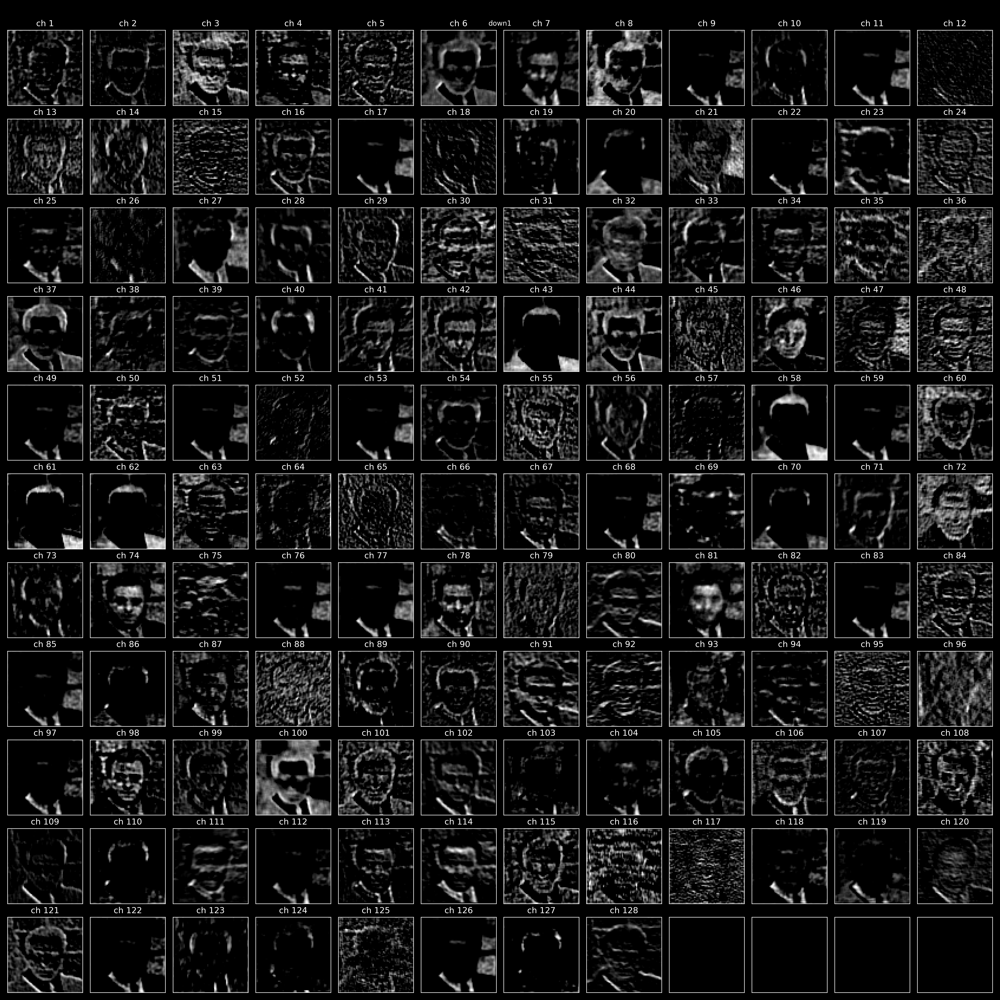
</details>

In [47]:
### START CODE HERE ###
class FeatureExtractor(nn.Module):
    def __init__(self, model, target_layers):
        super(FeatureExtractor, self).__init__()
        self.model = copy.deepcopy(model)
        self.target_layers = target_layers
        self.features = []

        for layer_name, layer in self.model.named_modules():
            if layer_name in target_layers:
                layer.register_forward_hook(self.save_feature(layer_name))

    def save_feature(self, layer_name):
        def hook(module, input, output):
            self.features.append(output)
        return hook

    def forward(self, x):
        self.features = []
        self.model(x)
        return self.features

In [48]:
### START CODE HERE ###
def visualize_feature_map(x, base_filename):
    """
    Visualize and save feature maps from a layer
    
    Args:
        x: Tensor of shape (batch_size, channels, height, width) or (channels, height, width)
        base_filename: Base name for saving the image file
    """
    if torch.is_tensor(x):
        x = x.detach().cpu()
    
    # Take first sample from batch if needed
    if len(x.shape) == 4:
        x = x[0]  # Shape: (channels, height, width)
    
    num_channels = x.shape[0]
    
    # Limit number of channels for better visualization
    max_channels = min(64, num_channels)
    x = x[:max_channels]
    
    # Determine grid size for visualization
    grid_size = int(np.ceil(np.sqrt(max_channels)))
    
    # Create figure
    fig, axes = plt.subplots(grid_size, grid_size, figsize=(15, 15))
    fig.suptitle(f'Feature Maps - {base_filename} | Channels: {num_channels}', fontsize=16)
    
    # Handle single subplot case
    if grid_size == 1:
        axes = [axes]
    else:
        axes = axes.flatten()
    
    # Plot each channel
    for i in range(max_channels):
        feature_map = x[i].numpy()
        
        # Normalize feature map for better visualization
        if feature_map.max() > feature_map.min():
            feature_map = (feature_map - feature_map.min()) / (feature_map.max() - feature_map.min())
        
        axes[i].imshow(feature_map, cmap='viridis')
        axes[i].set_title(f'Ch {i+1}', fontsize=10)
        axes[i].axis('off')
    
    # Hide empty subplots
    for i in range(max_channels, len(axes)):
        axes[i].axis('off')
    
    plt.tight_layout()
    
    # Save the figure
    save_path = f'{base_filename}.png'
    plt.savefig(save_path, dpi=150, bbox_inches='tight', facecolor='white')
    print(f"Feature map saved as: {save_path}")
    
    plt.show()
### END CODE HERE ###

🔍 Extracting and visualizing feature maps from all layers...
Target layers: ['conv_in', 'down1', 'up4', 'conv']
Extracted 4 feature maps

--- Layer: conv_in ---
Feature shape: torch.Size([1, 64, 128, 128])
Min: -1.4314, Max: 1.4369
Feature map saved as: featuremap_conv_in.png


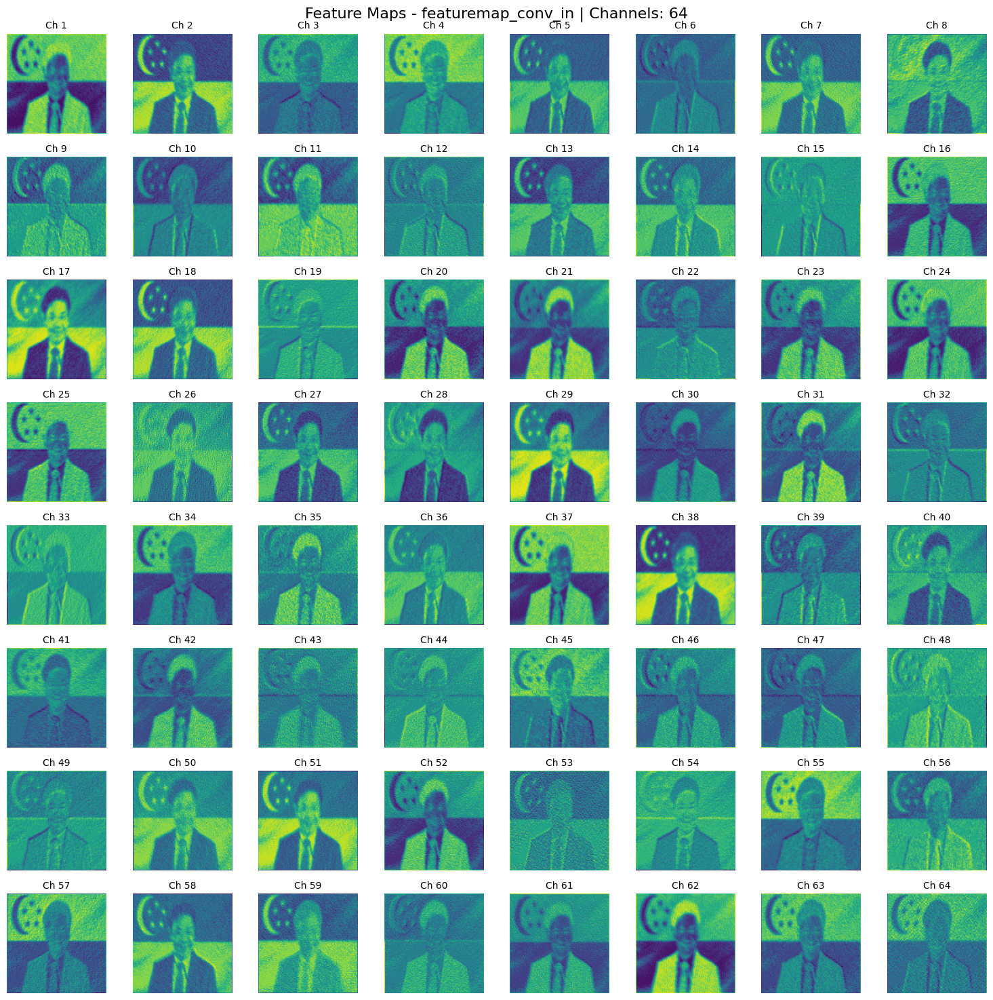


--- Layer: down1 ---
Feature shape: torch.Size([1, 128, 64, 64])
Min: 0.0000, Max: 1.5189
Feature map saved as: featuremap_down1.png


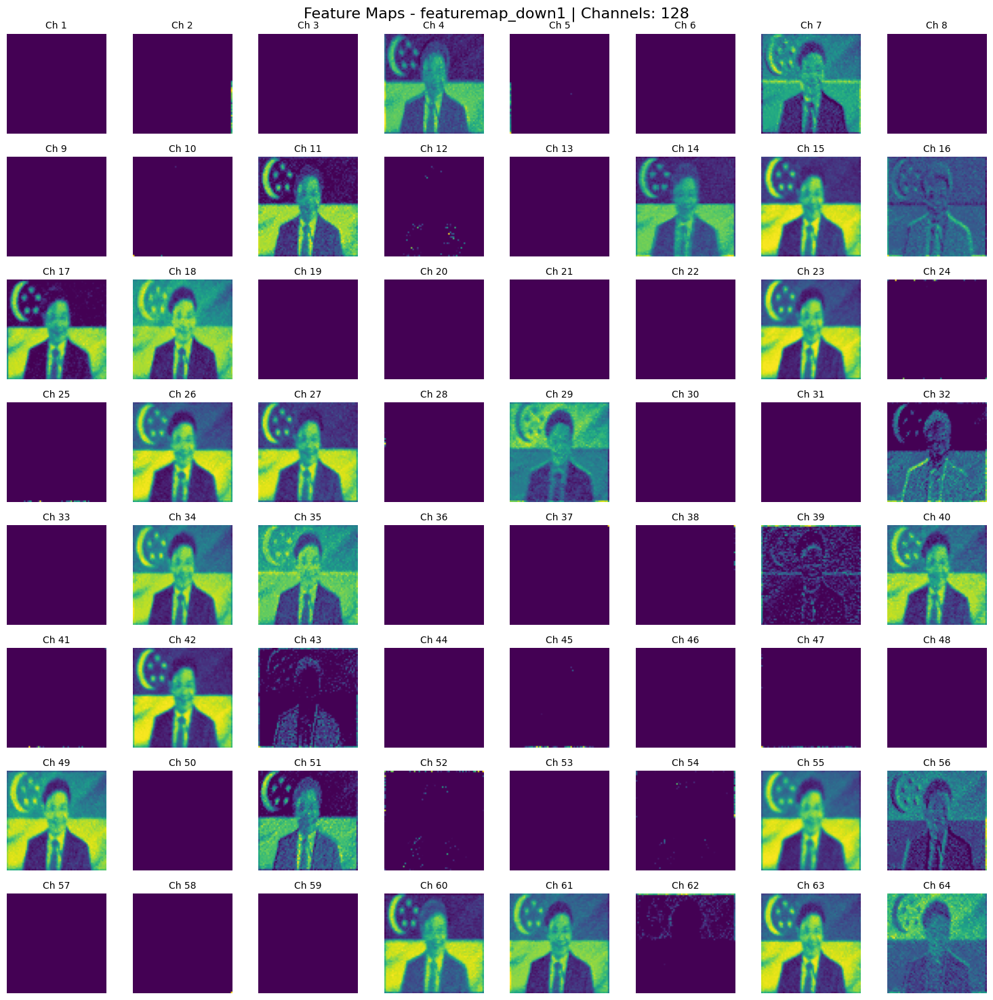


--- Layer: up4 ---
Feature shape: torch.Size([1, 64, 128, 128])
Min: 0.0000, Max: 1.7193
Feature map saved as: featuremap_up4.png


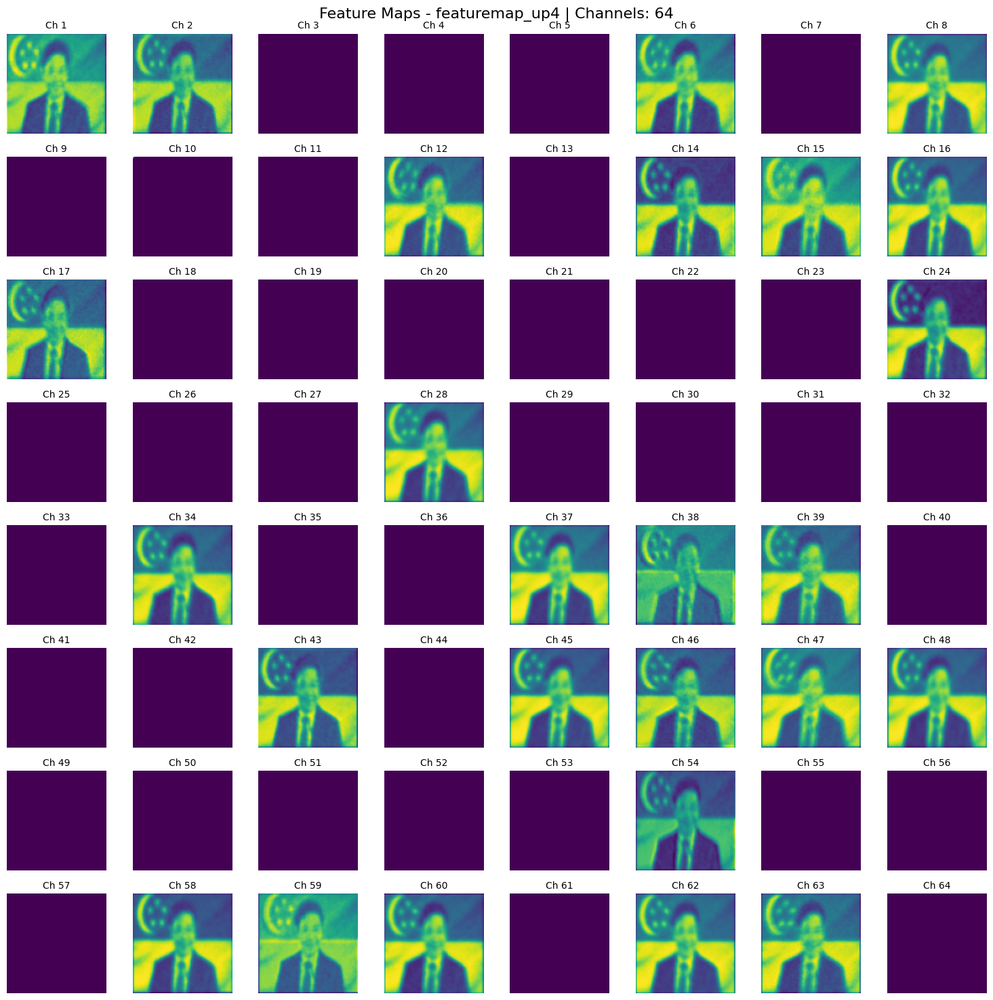


--- Layer: conv ---
Feature shape: torch.Size([1, 3, 128, 128])
Min: 0.0606, Max: 1.1252
Feature map saved as: featuremap_conv.png


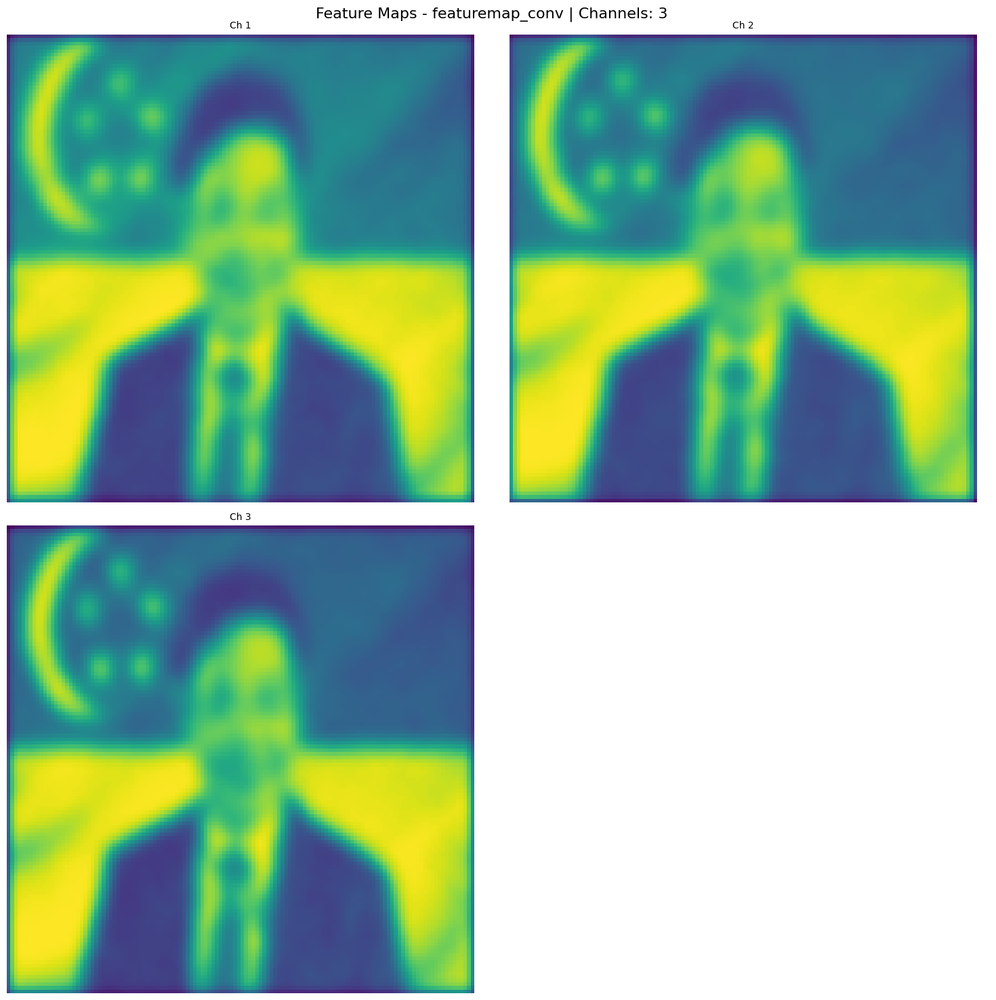


✅ Feature map extraction and visualization completed!

🎯 Creating summary visualization...


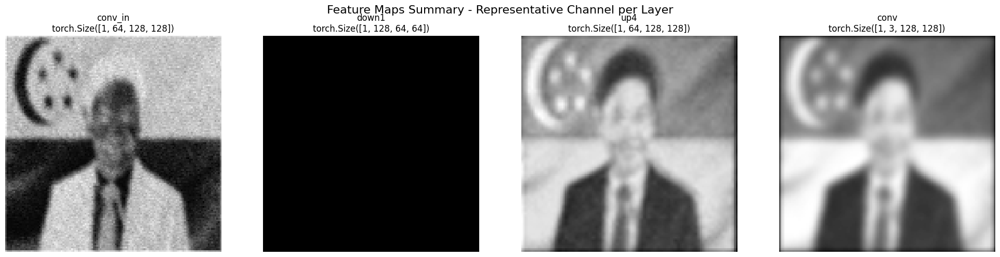

Summary visualization saved as: feature_maps_summary.png


In [50]:
# Set model to evaluation mode
model.eval()
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)

# Get a sample image for feature extraction
test_image, _ = next(iter(testloader))
sample_image = test_image[0:1].to(device)  # Take first image and keep batch dimension

print("🔍 Extracting and visualizing feature maps from all layers...")

# Define target layers for extraction (all major layers/blocks)
target_layers = ['conv_in', 'down1', 'up4', 'conv']

print(f"Target layers: {target_layers}")

# Create feature extractor
feature_extractor = FeatureExtractor(model, target_layers)

# Extract features
with torch.no_grad():
    extracted_features = feature_extractor(sample_image)

print(f"Extracted {len(extracted_features)} feature maps")

# Visualize each layer's feature maps
for i, (layer_name, features) in enumerate(zip(target_layers, extracted_features)):
    print(f"\n--- Layer: {layer_name} ---")
    print(f"Feature shape: {features.shape}")
    print(f"Min: {features.min():.4f}, Max: {features.max():.4f}")
    
    # Create clean filename
    clean_name = layer_name.replace('.', '_')
    filename = f"featuremap_{clean_name}"
    
    # Visualize and save
    visualize_feature_map(features, filename)

print("\n✅ Feature map extraction and visualization completed!")

# Create a summary showing one representative channel from each layer
print("\n🎯 Creating summary visualization...")

fig, axes = plt.subplots(1, len(extracted_features), figsize=(20, 5))
fig.suptitle('Feature Maps Summary - Representative Channel per Layer', fontsize=16)

if len(extracted_features) == 1:
    axes = [axes]

for i, (layer_name, features) in enumerate(zip(target_layers, extracted_features)):
    # Take first channel of first sample
    feature_map = features[0, 0].detach().cpu().numpy()
    
    # Normalize
    if feature_map.max() > feature_map.min():
        feature_map = (feature_map - feature_map.min()) / (feature_map.max() - feature_map.min())
    
    axes[i].imshow(feature_map, cmap='gray')      # Traditional grayscale
    axes[i].set_title(f'{layer_name}\n{features.shape}', fontsize=12)
    axes[i].axis('off')

plt.tight_layout()
plt.savefig('feature_maps_summary.png', dpi=150, bbox_inches='tight', facecolor='white')
plt.show()

print("Summary visualization saved as: feature_maps_summary.png")
### END CODE HERE ###

---

# Questions:
1. Explain how changing the number of layers and the number of nodes in a Convolutional Neural Network (CNN) affects its performance (model accuracy, training time, and generalization/overfitting?  
2. Explain a comparison of PSNR and SSIM values (objective measurment) to your eye perception (subjective measurement) and suggest the criteria for High, Medium, Low image quality.
3. Explain a comparison of the autoencoder results between training without/with augmentation by visualizing feature maps at each layer.
4. Ranking the autoencoder performance in terms of PSNR and SSIM for each augmentation technique. Which augmentation techiques are mostly affect the autoencoder performance and must introduce to the training?
5. If a flatten layer is added after the last downsampling block to create the latent code (1D) and a dense layer ((linear + activation node)+ reshape back to the feature map size of input of the first upsampling block ) is added at the first layer of decoder before the first upsampling block. Explain a comparison of autoencoder results between 2D vs 1D latent and how feature map of each decoder block changes?
6. Explain the effect of reduced latent code from 2D to 1D.